In [ ]:
Let's try to predict the prices of houses in Melbourne! First of all I recommend you to have a look at the characteristics of the dataset and the information about each one of the variables

https://www.kaggle.com/dansbecker/melbourne-housing-snapshot

In [ ]:
First of all we will import all the libraries we will need; we will use seaborn and matplotlib for visualization, then sklearn to make pipelines, transform the data and several regression models

In [91]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LinearRegression

from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import IsolationForest
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import KFold

In [ ]:
# Analysis
Let's take a look at the dataset (great work by the way, Tony Pino¡)

In [51]:
url = r"C:\Users\gonza\Downloads\melb_data.csv\melb_data.csv"
data = pd.read_csv(url,parse_dates=["Date"])
data.head(3)

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,2016-03-12,2.5,3067.0,...,1.0,1.0,202.0,NaN,NaN,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,2016-04-02,2.5,3067.0,...,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,2017-04-03,2.5,3067.0,...,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0


In [ ]:
Let's first check if there is Nan and the percentage; to do this I create a small function that returns a dataframe with these values.

In [52]:
# vemos nullos
def show_nam_df(x):
    """
    returns the Nan number of a dataframe and the percentage
    """
    nulos = x.isnull().sum()
    col_nul = nulos[nulos > 0]
    col_por = round((col_nul / len(x)) * 100,2)
    df_nul = pd.DataFrame(data={"Total_Nan":col_nul,"Percentage":col_por})
    return df_nul

In [53]:
show_nam_df(data)

,Total_Nan,Percentage
Car,62,0.46
BuildingArea,6450,47.50
YearBuilt,5375,39.58
CouncilArea,1369,10.08


In [ ]:
woww there are two features (BuildingArea,YearBuilt ) that have a high percentage of null data.
We'll see what we can do with that later.

Now with Describe we see already interesting data.

In [58]:

data.describe()

,Rooms,Price,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Propertycount
count,13580.000000,1.358000e+04,13580.000000,13580.000000,13580.000000,13580.000000,13518.000000,13580.000000,7130.000000,8205.000000,13580.000000,13580.000000,13580.000000
mean,2.937997,1.075684e+06,10.137776,3105.301915,2.914728,1.534242,1.610075,558.416127,151.967650,1964.684217,-37.809203,144.995216,7454.417378
std,0.955748,6.393107e+05,5.868725,90.676964,0.965921,0.691712,0.962634,3990.669241,541.014538,37.273762,0.079260,0.103916,4378.581772
min,1.000000,8.500000e+04,0.000000,3000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1196.000000,-38.182550,144.431810,249.000000
25%,2.000000,6.500000e+05,6.100000,3044.000000,2.000000,1.000000,1.000000,177.000000,93.000000,1940.000000,-37.856822,144.929600,4380.000000
50%,3.000000,9.030000e+05,9.200000,3084.000000,3.000000,1.000000,2.000000,440.000000,126.000000,1970.000000,-37.802355,145.000100,6555.000000
75%,3.000000,1.330000e+06,13.000000,3148.000000,3.000000,2.000000,2.000000,651.000000,174.000000,1999.000000,-37.756400,145.058305,10331.000000
max,10.000000,9.000000e+06,48.100000,3977.000000,20.000000,8.000000,10.000000,433014.000000,44515.000000,2018.000000,-37.408530,145.526350,21650.000000


In [ ]:
There are many extreme values in most columns: 20 Bedrooms2, 10 Car, 10 rooms...this should be the data of a big mansion!

In [7]:
# now with "object" include.
data.describe(include="object")

,Suburb,Address,Type,Method,SellerG,CouncilArea,Regionname
count,13580,13580,13580,13580,13580,12211,13580
unique,314,13378,3,5,268,33,8
top,Reservoir,36 Aberfeldie St,h,S,Nelson,Moreland,Southern Metropolitan
freq,359,3,9449,9022,1565,1163,4695


In [ ]:
Most of them are located in the Southern Metropolitan region, they are type h (house, cottage, villa, semi, terrace)

In [8]:
# Vamos a trabajar con una copia, sin las columnas con mas nan ( son demasiados)
cols_remove = ["BuildingArea","YearBuilt"]
data_remove = data.copy().drop(cols_remove,axis=1)


In [ ]:
I will create a function that returns a groupby,the average, the percentage of the total and sort by "Price" . This way we can see data in a more specific way

In [62]:
# funcion para describe mas porcentaje sobre el total
def describe_porcentage(groupby="CouncilArea",sort="Price",df=data):
    """
    function that returns a groupby, the average and the percentage of the total
    sort by Price.
    """
    type_remove = ["Postcode","Lattitude","Longtitude"]
    type_porcentaje = round(df.groupby(groupby).size() / len(df) * 100,2)
    type_df = df.drop(type_remove,axis=1).groupby(groupby).mean()
    type_df["Percentage"] = type_porcentaje.values
    return type_df.sort_values(by=sort,ascending=False)

In [ ]:
I will apply this function to Regionname and Type; let's see what happens!

In [64]:
describe_porcentage(groupby="Type",sort="Percentage",df=data)

,Rooms,Price,Distance,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Propertycount,Percentage
Type,,,,,,,,,,,
h,3.260874,1.242665e+06,10.979479,3.229336,1.613822,1.771222,617.181924,176.866248,1954.081176,7259.025505,69.58
u,1.963871,6.051275e+05,7.607391,1.966523,1.183295,1.128358,477.314219,80.737121,1980.016708,8199.280080,22.22
t,2.837522,9.337351e+05,9.851346,2.814183,1.809695,1.555655,279.606822,140.046323,1998.988189,7094.459605,8.20


In [ ]:
house,cottage,villa, semi,terrace represent almost 70 percent of the data, they are the ones with the most expensive average price, the oldest and the ones that are farthest from the CBD

In [106]:
# I will use style.background_gradient to improve the visualization
describe_porcentage(groupby="Regionname",sort="Price",df=data).style.background_gradient(cmap='Greys')

,Rooms,Price,Distance,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Propertycount,Percentage
Regionname,,,,,,,,,,,
Southern Metropolitan,2.860916,1372963.369329,8.756656,2.835144,1.624068,1.576264,509.252183,153.580962,1960.523777,7622.279233,34.570000
Eastern Metropolitan,3.322230,1104079.634262,13.901088,3.313392,1.698844,1.792916,634.133923,178.001521,1971.859903,5713.788579,10.830000
South-Eastern Metropolitan,3.360000,922943.784444,23.813556,3.355556,1.657778,2.044444,613.991111,162.734296,1976.859504,6589.366667,3.310000
Northern Metropolitan,2.755527,898171.082262,8.078329,2.734190,1.367866,1.454123,568.948072,124.177723,1962.764286,9485.602057,28.650000
Western Metropolitan,3.023406,866420.520014,10.104579,2.990502,1.501018,1.696392,493.606852,144.697623,1968.155192,5561.785957,21.710000
Eastern Victoria,3.396226,699980.792453,34.209434,3.396226,1.811321,2.056604,2949.698113,183.645000,1984.032258,8872.358491,0.390000
Northern Victoria,3.560976,594829.268293,33.748780,3.560976,1.853659,1.925000,3355.463415,1746.374286,1986.666667,4260.975610,0.300000
Western Victoria,3.406250,397523.437500,30.753125,3.406250,1.468750,1.843750,655.500000,134.683810,1982.565217,4191.156250,0.240000


In [ ]:
The most expensive region with the largest number of properties is in Southern Metropolitan, the most populated region is Northern Metropolitan, those with the largest landsize and most recent construction are in Northern Victoria

In [ ]:
Visualizing the data is always a good idea, they can show us things that could go unnoticed.
As we said before there are many extreme values (8 quarterbaths !) and distributions are not normal (Distance and prices)

Text(0.5, 1.0, 'Melbourne Housing Snapshot')

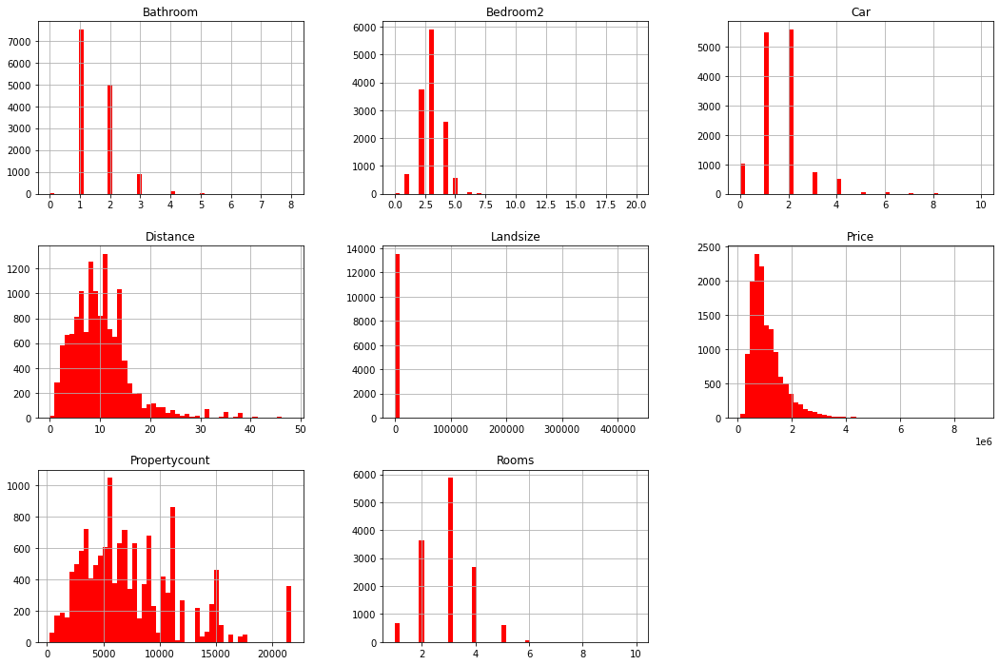

In [67]:

# I will use only these features       
hist_cols = ['Rooms','Price','Distance','Bedroom2', 'Bathroom', 'Car','Landsize','Propertycount']
data[hist_cols].hist(bins=50,figsize=(18,12),color="red")
plt.title("Melbourne Housing Snapshot")

In [ ]:
Let's check the correlation to the price using a little colour!

In [69]:
# I will use style.background_gradient to improve the visualization
corr = data.corr()
pd.DataFrame(corr["Price"].sort_values(ascending=False)).style.background_gradient(cmap='magma')

,Price
Price,1.000000
Rooms,0.496634
Bedroom2,0.475951
Bathroom,0.467038
Car,0.238979
Longtitude,0.203656
Postcode,0.107867
BuildingArea,0.090981
Landsize,0.037507
Propertycount,-0.042153


In [ ]:
The correlation coefficient ranges from –1 to 1. When it is close to 1, it means that
there is a strong positive correlation; for example, the median house value tends to go
up when the Rooms or Bathroom go up. When the coefficient is close to –1, it means
that there is a strong negative correlation; you can see a small negative correlation
between the latitude or Yearbuilt and the median house value (i.e., prices have a slight tendency to
go down when you go north). Finally, coefficients close to zero mean that there is no
linear correlation

In [ ]:
Before, seeing the correlation, I wondered if there is a multi-collinearity, since, for example, Rooms and Bedrooms2 could provide the same information.

In [102]:
corr.style.background_gradient(cmap='Greys')

,Rooms,Price,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Propertycount
Rooms,1.000000,0.496634,0.294203,0.055303,0.944190,0.592934,0.408483,0.025678,0.124127,-0.065413,0.015948,0.100771,-0.081530
Price,0.496634,1.000000,-0.162522,0.107867,0.475951,0.467038,0.238979,0.037507,0.090981,-0.323617,-0.212934,0.203656,-0.042153
Distance,0.294203,-0.162522,1.000000,0.431514,0.295927,0.127155,0.262994,0.025004,0.099481,0.246379,-0.130723,0.239425,-0.054910
Postcode,0.055303,0.107867,0.431514,1.000000,0.060584,0.113664,0.050289,0.024558,0.055475,0.032863,-0.406104,0.445357,0.062304
Bedroom2,0.944190,0.475951,0.295927,0.060584,1.000000,0.584685,0.405325,0.025646,0.122319,-0.053319,0.015925,0.102238,-0.081350
Bathroom,0.592934,0.467038,0.127155,0.113664,0.584685,1.000000,0.322246,0.037130,0.111933,0.152702,-0.070594,0.118971,-0.052201
Car,0.408483,0.238979,0.262994,0.050289,0.405325,0.322246,1.000000,0.026770,0.096101,0.104515,-0.001963,0.063395,-0.024295
Landsize,0.025678,0.037507,0.025004,0.024558,0.025646,0.037130,0.026770,1.000000,0.500485,0.036451,0.009695,0.010833,-0.006854
BuildingArea,0.124127,0.090981,0.099481,0.055475,0.122319,0.111933,0.096101,0.500485,1.000000,0.019665,0.043420,-0.023810,-0.028840
YearBuilt,-0.065413,-0.323617,0.246379,0.032863,-0.053319,0.152702,0.104515,0.036451,0.019665,1.000000,0.060445,-0.003470,0.006361


In [ ]:
  Rooms and Bedrooms2 are extremely correlated; Longtitude, Distance and Postcode also ¡ and it makes sense because they tell us the same thing but with different names.

In [ ]:
Let's make a visual representation, using a map of Melbourne, and see what it says!
I have used this article for its elaboration as well as the book Hands on Machine Learning by  Aurelien Geron

https://towardsdatascience.com/easy-steps-to-plot-geographic-data-on-a-map-python-11217859a2db

In [17]:
# Now, we have to define the Bounding Box. Bounding Box is the area defined by two longitudes and two latitudes that will include all spatial points.
BBox = (data_remove.Longtitude.min(),data_remove.Longtitude.max(),
        data_remove.Lattitude.min(),data_remove.Lattitude.max())

BBox

(144.43181, 145.52635, -38.18255, -37.40853)

In [ ]:
That is a representation of the distribution of prices in Melbourne and also of the density of the number of houses (Propertycount); the lighter areas, with less density, as we can see, are in the suburbs. The most expensive region with the largest number of properties is in Southern Metropolitan.

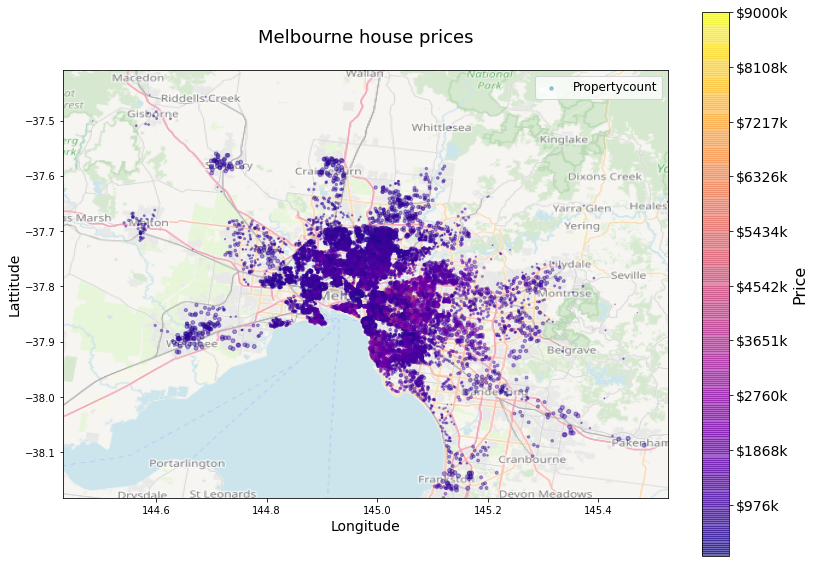

In [76]:
# this is a small map of Melbourne (map.png)
map = plt.imread(r"C:\Users\gonza\Repositorios\TestGit\map.png")

#now we create the figure for visualization using scatter plot
fig, ax = plt.subplots(figsize = (12,10))
ax.scatter(x="Longtitude",y="Lattitude",c="Price", alpha=0.4,cmap=plt.get_cmap("plasma"),s=data["Propertycount"]/1000,label="Propertycount",data=data,zorder=1)

# title,label.
ax.set_title('Melbourne house prices',fontsize=18,y=1.05)
ax.set_xlim(BBox[0],BBox[1])
ax.set_ylim(BBox[2],BBox[3])
plt.xlabel("Longitude",fontsize=14)
plt.ylabel("Lattitude",fontsize=14)

# with imshow we load any image
img = ax.imshow(map, zorder=0, extent = BBox, aspect= 'equal',cmap=plt.get_cmap("plasma"),alpha=0.6)

# we adjust colorbar
prices = data["Price"]
tick_values = np.linspace(prices.min(), prices.max(), 11)
cb = plt.colorbar(img,ticks=tick_values/prices.max(),fraction=0.046, pad=0.05)
cb.ax.set_yticklabels(["$%dk"%(round(v/1000)) for v in tick_values], fontsize=14)
cb.set_label("Price",fontsize=16)
plt.legend(fontsize=12)

In [ ]:
### The model

We could continue with the analysis of the data (there is much to see!) but I prefer to focus on the model and that everything goes well :) 

First I'm going to remove some columns from the dataframe, either because I think they don't give me relevant information, or because they are correlated with other features (Bedrooms2) or because the number of missing values is too high (BuildingArea, YearBuilt)	

We could complete the missing data (BuildingArea, YearBuilt) using the average of the properties in the area (using Postalcode, councilarea or suburb) but I prefer not to because it doesn't give me security.

I invite you to see this link in which the author does it this way in an extraordinary way.	

https://www.kaggle.com/bichithkcherian/melbourne-housing-analysis

In [77]:
# delete these columns
cols_remove_model = ["Bedroom2","Suburb","Address",'Method','SellerG',"Date","BuildingArea", "YearBuilt"]

In [79]:
# new dataframe without these columns
data_model = data.copy().drop(cols_remove_model,axis=1)


In [80]:
data_model.head(3)

,Rooms,Type,Price,Distance,Postcode,Bathroom,Car,Landsize,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,2,h,1480000.0,2.5,3067.0,1.0,1.0,202.0,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0
1,2,h,1035000.0,2.5,3067.0,1.0,0.0,156.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0
2,3,h,1465000.0,2.5,3067.0,2.0,0.0,134.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0


In [ ]:
Here we already have our independent variables and the one we are going to predict.

In [81]:
X = data_model.drop("Price",axis=1)
y = data_model["Price"]

In [ ]:
###  Preprocessing Steps

first I create a pipeline, for the categorical and the numerical variables. For null values we use SimpleImputer either using the median or the most frequent value.

then we apply standarscaler and onehotencoder

We use the ColumnTransformer class to bundle together different preprocessing steps. 

In [82]:
# separate categorical and numerical
categorical_cols=[x for x in data_model.columns.values if data_model[x].dtype == "object"]
numerical_cols = [x for x in X.columns.values if x not in categorical_cols]

In [83]:
# prepocesing numerical data
numerical_transformer = Pipeline(steps=[
    ("imputer",SimpleImputer(strategy="median")),
    ("scaler",StandardScaler())
])
# prepocesing categorical data
categorical_transformer = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("onehot",OneHotEncoder(handle_unknown="ignore"))
])

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

In [ ]:
### Define the Model

In [25]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

In [ ]:
I have created a few functions to: process training data and test data using pipelines, remove outliers and a baseline that gives me the results of various models 

In [84]:
def pipeline_train(X_train,X_test):
     # Bundle preprocessing and modeling code in a pipeline
    my_pipeline = Pipeline(steps=[('preprocessor', preprocessor)])                               
                               

    # Preprocessing of training data, fit model 
    X_train_fit = my_pipeline.fit_transform(X_train)
    X_test_fit = my_pipeline.transform(X_test)
    return X_train_fit,X_test_fit

    
def outliers(X_train,y_train):
    #outliers
    iso = IsolationForest(contamination=0.1)
    yhat = iso.fit_predict(X_train)

    # select all rows that are not outliers
    mask = yhat != -1
    X_train, y_train = X_train[mask, :], y_train[mask]
    return X_train, y_train



def baseline_regresion(X_train_fit,y_train):
    models ={"lr": LinearRegression(),"rdf":RandomForestRegressor(),"Dt":DecisionTreeRegressor(),
            "Gn":GradientBoostingRegressor()}           
    kfold = KFold(n_splits=10, shuffle=True)
    for key,model_kfold in models.items():        
        results_kfold = cross_val_score(model_kfold, X_train_fit, y_train, cv=kfold)
        print(f"Accuracy {key}: {round(results_kfold.mean()*100.0,2)}")



In [85]:
# fit and transform training data
X_train_fit,X_test_fit  = pipeline_train(X_train,X_test)

In [86]:
# remove outliers
X_train, y_train = outliers(X_train_fit,y_train)


In [87]:
# baseline
baseline_regresion(X_train,y_train)

Accuracy lr: 59.84428380781501
Accuracy rdf: 79.33872115187893
Accuracy Dt: 62.00516927523443
Accuracy Gn: 76.60769435621535


In [ ]:
we can see that the models that work best are random forest and gradient boosting; so we are going to focus on those two and try to get the best out of them by finding the best parameters.

I usually use RandomizedSearchCV because it usually works faster to find the best parameters.

In [89]:
## lets find best parameters for random forest
model_rdf = RandomForestRegressor(random_state=0)
rdf_grid = { "max_depth": [10, 20, 30, 40],
                    'max_features': ['auto', 'sqrt'],
                    'min_samples_leaf': [1, 2, 4],
                    'min_samples_split': [2, 5, 10],
                    'n_estimators': [50,100,200, 400]}
randomize_rdf = RandomizedSearchCV(model_rdf,rdf_grid,random_state=0,n_iter=100,cv=3,n_jobs=-1)
search_rdf = randomize_rdf.fit(X_train,y_train)
search_rdf.best_params_

{'n_estimators': 400,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 20}

In [100]:

print(f"the best score with  RandomForestRegressor best parameters was: {round(search_rdf.best_score_,2)}")

the best score was: 0.79


In [ ]:
Well, the data are not exactly spectacular; let's see what results we get with the test.

In [97]:
# with this function we get score and mae for xtest
def pipeline_test(X_test,y_test,model):
    """
    return score and mae
    """
     test_predictions = model.predict(X_test)
     test_mae =mean_absolute_error(test_predictions,y_test)
     print(f"Accuray test: {round(model.score(X_test,y_test),2)}")
     print(f"Mae test: {round(test_mae,2)}")

    

In [98]:
pipeline_test(X_test_fit,y_test,search_rdf.best_estimator_)

Accuray test: 0.77
Mae test: 173695.51


In [ ]:
we see that they are very similar to those obtained with the training set; the MAE is very high 173695.51 dollars   :(

maybe with gradient bootsing we will have better results!

In [101]:

model_gbr = GradientBoostingRegressor(random_state=0)
random_grid = { "max_depth": [10, 20, 30, 40],
                    'max_features': ['auto', 'sqrt'],
                    'min_samples_leaf': [1, 2, 4],
                    'min_samples_split': [2, 5, 10],
                    'n_estimators': [50,100,200, 400]}
randomizecv = RandomizedSearchCV(model_gbr,random_grid,random_state=0,n_iter=100,cv=3,n_jobs=-1)
search_gb = randomizecv.fit(X_train,y_train)
search_gb.best_params_

{'n_estimators': 100,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 10}

In [104]:
print(f"the best score with  GradientBoostingRegressorbest parameters was: {round(search_gb.best_score_,2)}")

the best score with  GradientBoostingRegressorbest parameters was: 0.8


In [105]:
pipeline_test(X_test_fit,y_test,search_gb.best_estimator_)

Accuray test: 0.77
Mae test: 172462.74


In [ ]:
Well, the results have improved a little bit, not enough to go out and celebrate, but that's something.
maybe in the future we can add more features, like Yearbuilt (it had a strong negative correlation), and maybe improve the model a bit more.

Thank you very much for having the patience to read my work until the end :)

Any suggestion or improvement is always welcome!